Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


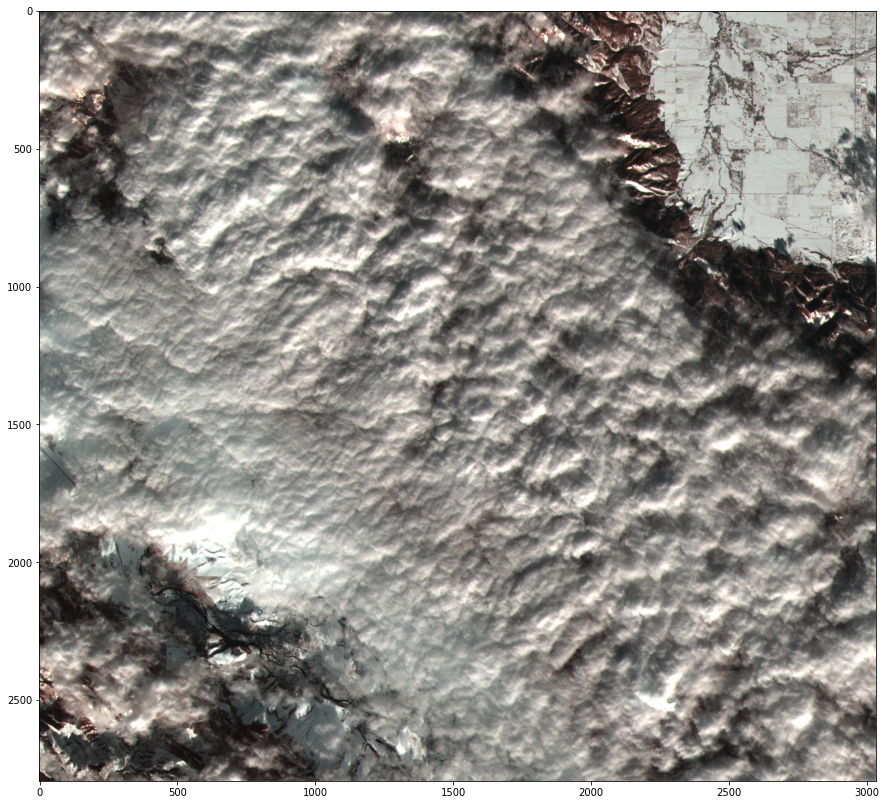

In [55]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from rasterio.enums import Resampling

bands = ["B01", "B02", "B04", "B05", "B08", "B8A", "B09", "B10", "B11", "B12"]
image_directory = os.path.join(
    "S2B_MSIL1C_20191209T181739_N0208_R084_T12TVP_20191209T200033.SAFE",
    "GRANULE",
    "L1C_T12TVP_A014410_20191209T182157",
    "IMG_DATA",
)
minx = 461470
miny = 4805355
maxx = 491830
maxy = 4833290


def plot_image(
    image=None, mask=None, ax=None, factor=3.5 / 255, clip_range=(0, 1), **kwargs
):
    if ax is None:
        _, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    mask_color = [255, 255, 255, 255] if image is None else [255, 255, 0, 100]
    if image is None:
        if mask is None:
            raise ValueError("image or mask should be given")
        image = np.zeros(mask.shape + (3,), dtype=np.uint8)
    ax.imshow(image)
    if mask is not None:
        cloud_image = np.zeros((mask.shape[0], mask.shape[1], 4), dtype=np.uint8)
        cloud_image[mask == 1] = np.asarray(mask_color, dtype=np.uint8)
        ax.imshow(cloud_image)


file_names = os.listdir(image_directory)
data = []
minrowcount = 0
mincolcount = 0
for i, band in enumerate(bands):
    file_name = next(file_name for file_name in file_names if band in file_name)
    path = os.path.join(image_directory, file_name)
    with rasterio.open(path) as dataset:
        maxrow, mincol = dataset.index(minx, miny)
        minrow, maxcol = dataset.index(maxx, maxy)
        rowcount = maxrow - minrow
        colcount = maxcol - mincol
        if rowcount > minrowcount:
            minrowcount = rowcount
        if colcount > mincolcount:
            mincolcount = colcount

out_shape = (minrowcount, mincolcount)
data = np.empty((out_shape[0], out_shape[1], len(bands)))
for i, band in enumerate(bands):
    file_name = next(file_name for file_name in file_names if band in file_name)
    path = os.path.join(image_directory, file_name)
    with rasterio.open(path) as dataset:
        maxrow, mincol = dataset.index(minx, miny)
        minrow, maxcol = dataset.index(maxx, maxy)
        band_data = dataset.read(
            1,
            out_shape=out_shape,
            resampling=Resampling.bilinear,
            window=((minrow, maxrow), (mincol, maxcol)),
        )
        data[:, :, i] = band_data
data = data.astype(np.float32) / 10000
true_color = data[:, :, [4, 3, 2]]
plot_image(true_color)

In [58]:
from s2cloudless import S2PixelCloudDetector

cloud_detector = S2PixelCloudDetector(all_bands=False)
probability_maps = cloud_detector.get_cloud_probability_maps(data)
mask = cloud_detector.get_cloud_masks(data)

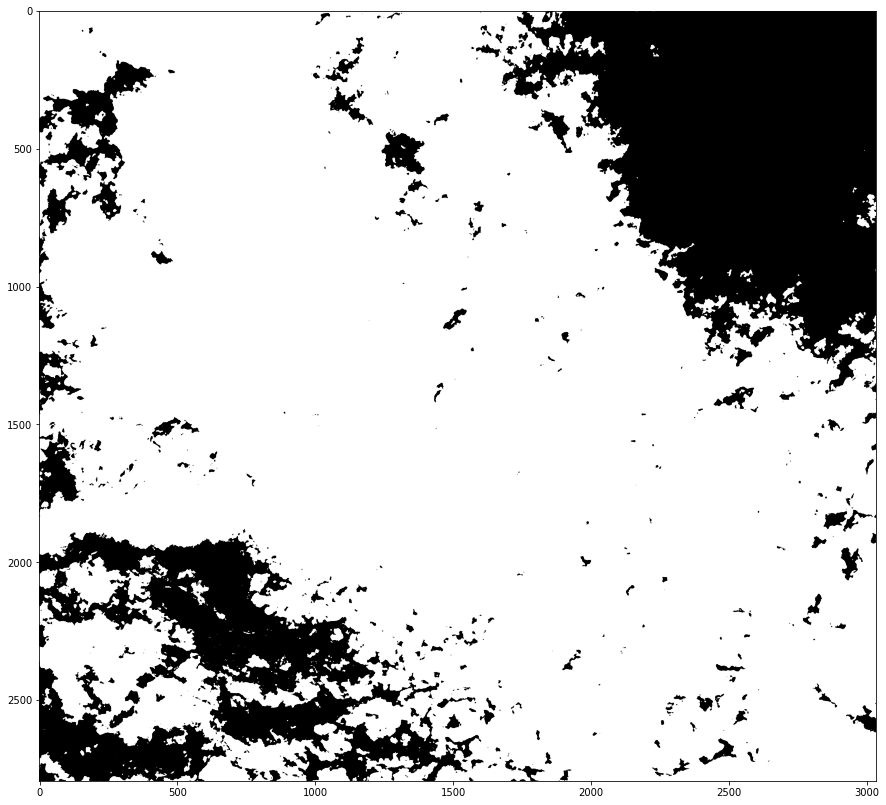

In [61]:
plot_image(mask=mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


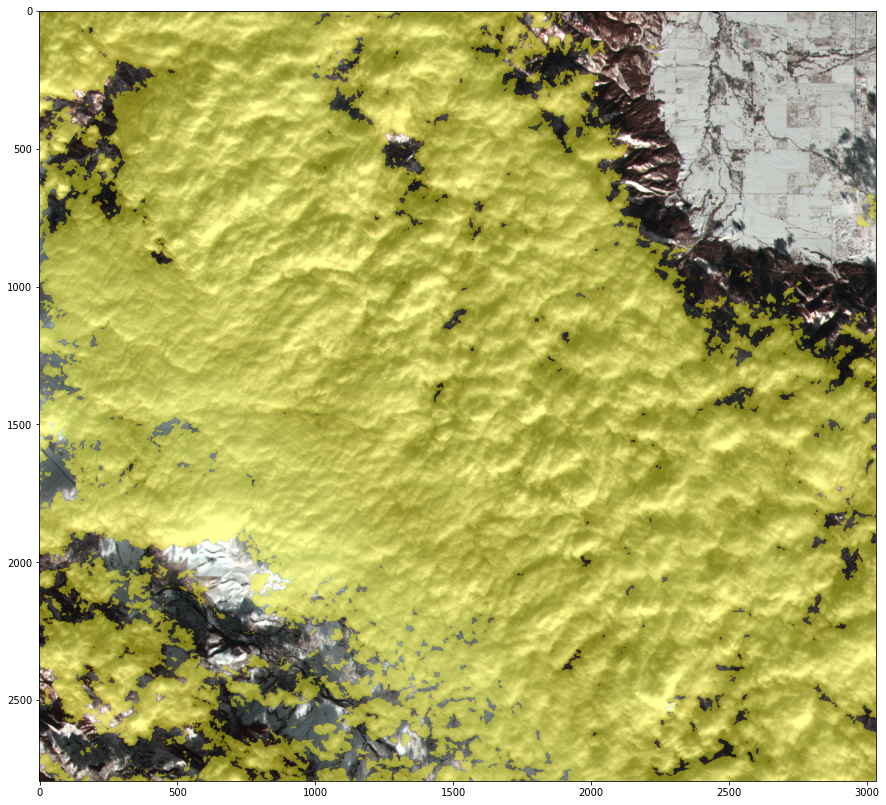

In [63]:
plot_image(true_color, mask=mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


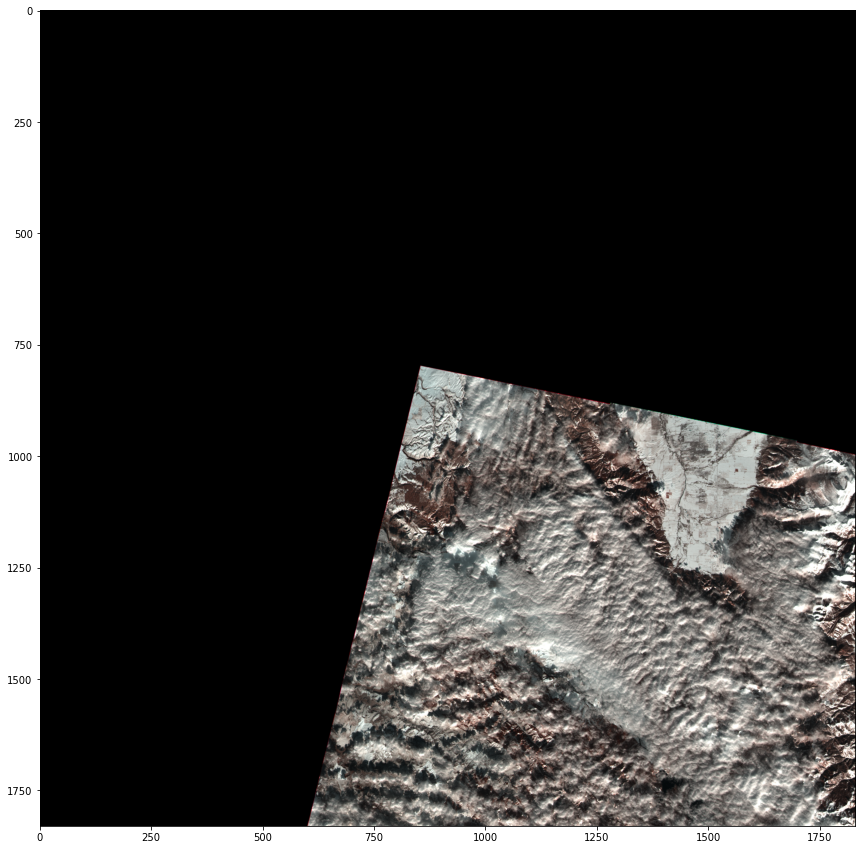

In [69]:
minrow = 1e9
mincol = 1e9
for i, band in enumerate(bands):
    file_name = next(file_name for file_name in file_names if band in file_name)
    path = os.path.join(image_directory, file_name)
    with rasterio.open(path) as dataset:
        row, col = dataset.shape
        if row < minrow:
            minrow = row
        if col < mincol:
            mincol = col
out_shape = (minrow, mincol)
data = np.empty((out_shape[0], out_shape[1], len(bands)))
for i, band in enumerate(bands):
    file_name = next(file_name for file_name in file_names if band in file_name)
    path = os.path.join(image_directory, file_name)
    with rasterio.open(path) as dataset:
        band_data = dataset.read(1, out_shape=out_shape, resampling=Resampling.bilinear)
        data[:, :, i] = band_data
data = data.astype(np.float32) / 10000
true_color = data[:, :, [4, 3, 2]]
plot_image(true_color)

In [72]:
probability_maps = cloud_detector.get_cloud_probability_maps(data)
mask = cloud_detector.get_cloud_masks(data)

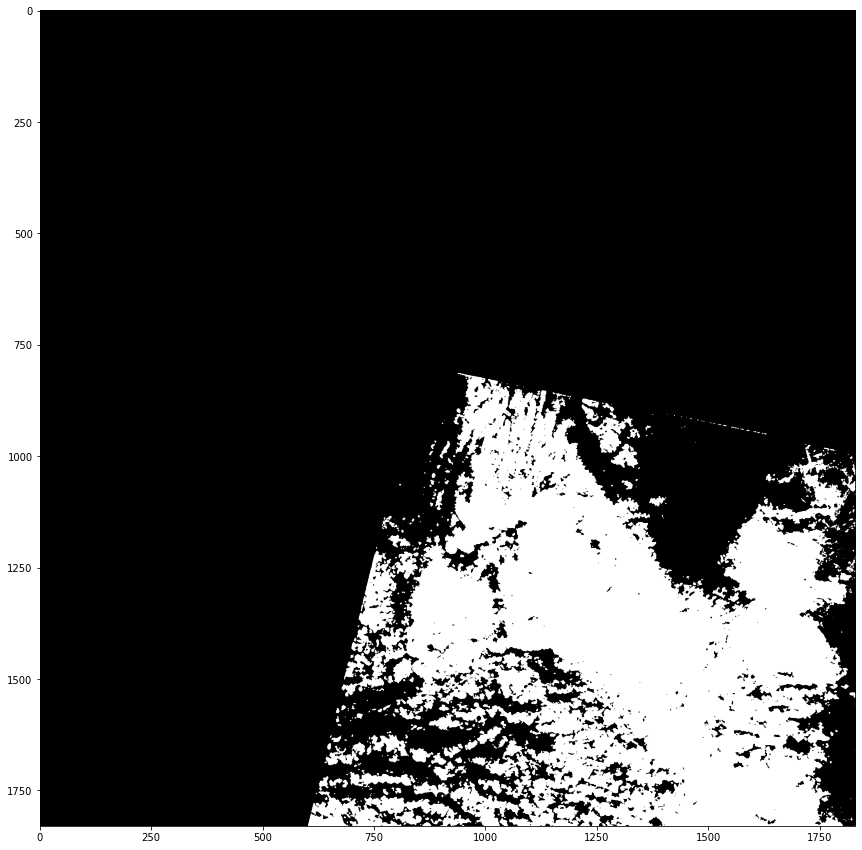

In [71]:
plot_image(mask=mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


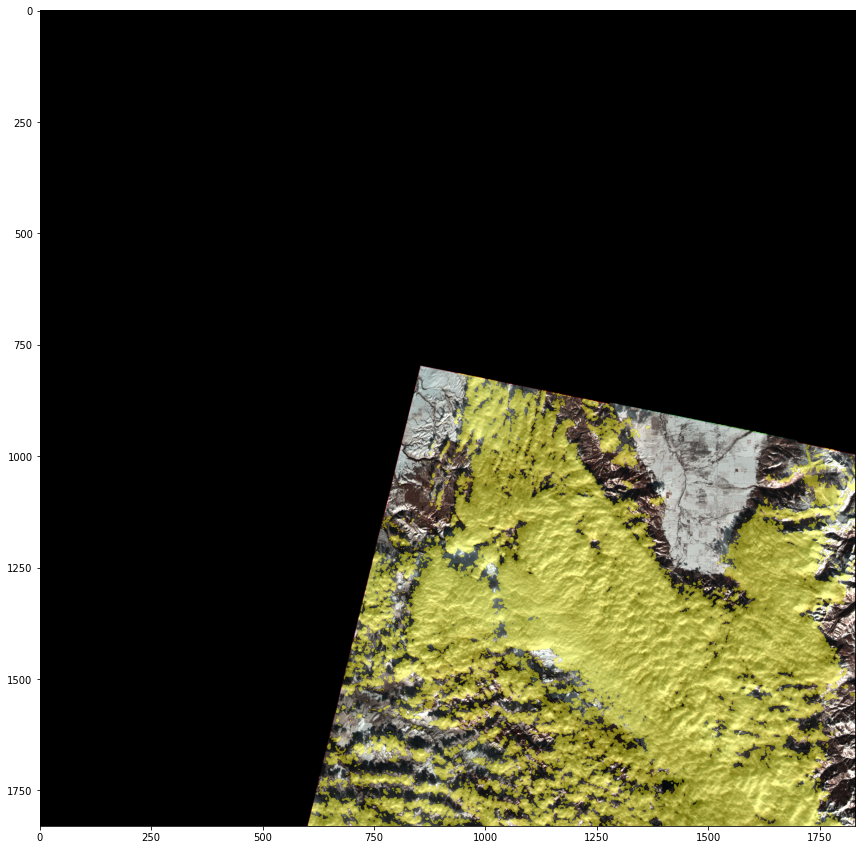

In [73]:
plot_image(true_color, mask=mask)